In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
bs = 291 # batch size

In [ ]:
!pip install -Uqq fastai fastbook nbdev

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.8/64.8 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 107.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.2/486.2 kB 52.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 77.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.7/58.7 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 24.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 30.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 80.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
from fastai import *
from fastbook import *
from fastai.vision.all import *

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
%cd /content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222

/content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222


In [ ]:
data_path ='/content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222'
image_count = get_image_files(data_path)
image_count

(#5769) [Path("/content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222/Za'atar Bread/image_1.jpg"),Path("/content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222/Za'atar Bread/image_9.jpg"),Path("/content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222/Za'atar Bread/image_10.jpg"),Path("/content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222/Za'atar Bread/image_3.jpg"),Path("/content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222/Za'atar Bread/image_4.jpg"),Path("/content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222/Za'atar Bread/image_2.jpg"),Path("/content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222/Za'atar Bread/image_8.jpg"),Path("/content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222/Za'atar Bread/image_7.jpg"),Path("/content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222/Za'atar Bread/image_11.jpg"),Path("/content/drive/MyDrive/Food_303_Dataset/RAW_DATASET/222/Za'atar Bread/image_5.jpg")...]

In [ ]:
dblock = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter=RandomSplitter(valid_pct = 0.1, seed = 42),
    get_y = parent_label,
    item_tfms=Resize(128)
)

In [ ]:
dls = dblock.dataloaders(data_path, bs=bs)

In [ ]:
dls.train.vocab

['Aloo Baingan', 'Aloo Gobi', 'Aloo Matar', 'Aloo Paratha', 'Aloo Tikki', 'Apple pie', 'Arayes', 'Arayes Kafta', 'Baba Ghanoush', 'Baby back ribs', 'Baghlava', 'Baklava', 'Balah El Sham', 'Balaleet', 'Bamia', 'Bamieh', 'Basbousa', 'Batata Harra', 'Beef carpaccio', 'Beef tartare', 'Beignets', 'Bhindi Masala', 'Bibimbap', 'Biryani', 'Bread pudding', 'Breakfast burrito food', 'Bruschetta', 'Butter Chicken', 'Butter Naan', 'Caesar salad', 'Cannoli', 'Caprese salad', 'Carrot cake', 'Ceviche', 'Chana Masala food', 'Cheeseburger', 'Cheesecake', 'Chicken 555', 'Chicken 65', 'Chicken 65 Biryani', 'Chicken Biriyani', 'Chicken Biryani', 'Chicken Chettinad', 'Chicken Chilli', 'Chicken Dum Biryani food', 'Chicken Frankie', 'Chicken Fried Rice', 'Chicken Handi', 'Chicken Kebab', 'Chicken Korma', 'Chicken Liver Fry', 'Chicken Lollipop', 'Chicken Manchurian', 'Chicken Masala', 'Chicken Noodles', 'Chicken Popcorn', 'Chicken Pulao', 'Chicken Shawarma', 'Chicken Tandoori', 'Chicken Tikka Masala', 'Chicke

In [ ]:
dls.train.show_batch(max_n = 291, nrows = 50)

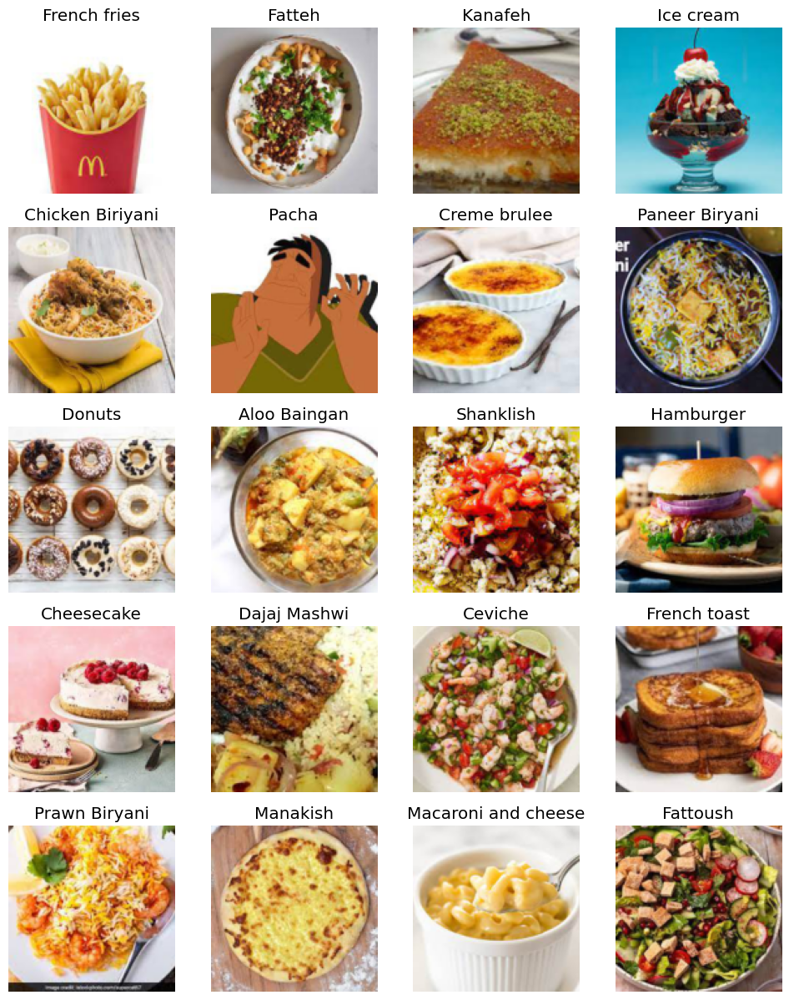

In [ ]:
dls.valid.show_batch(max_n=20, nrows=5)

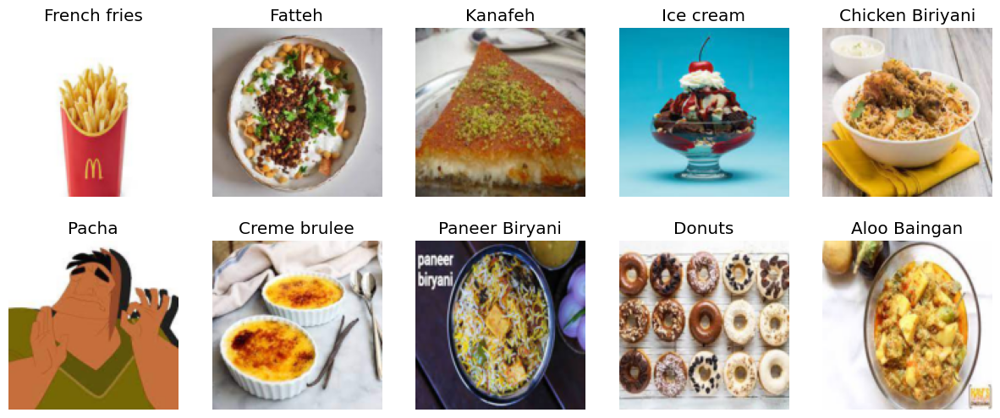

In [ ]:
dblock = dblock.new(item_tfms=Resize(128, ResizeMethod.Squish)) # Squishing the whole image into (128 x 128) size
dls = dblock.dataloaders(data_path)
dls.valid.show_batch(max_n=10, nrows=2)

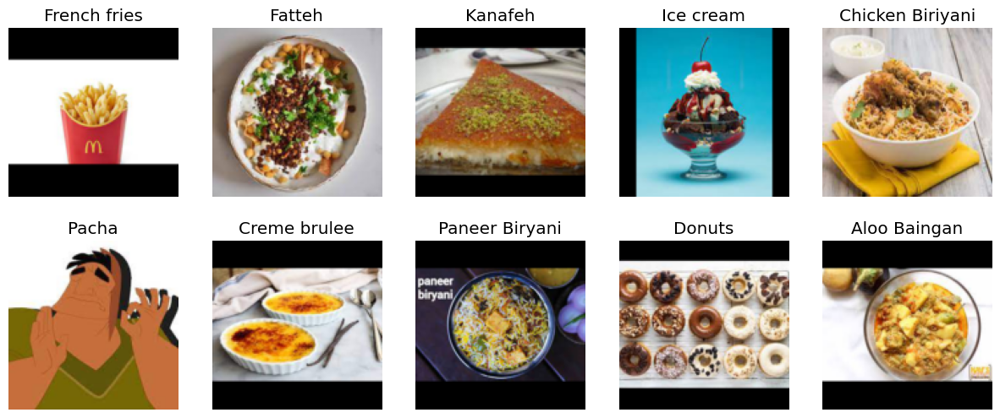

In [ ]:
dblock = dblock.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros')) # Padding the extra spaced the whole image into (128 x 128) size without squishing
dls = dblock.dataloaders(data_path)
dls.valid.show_batch(max_n=10, nrows=2)

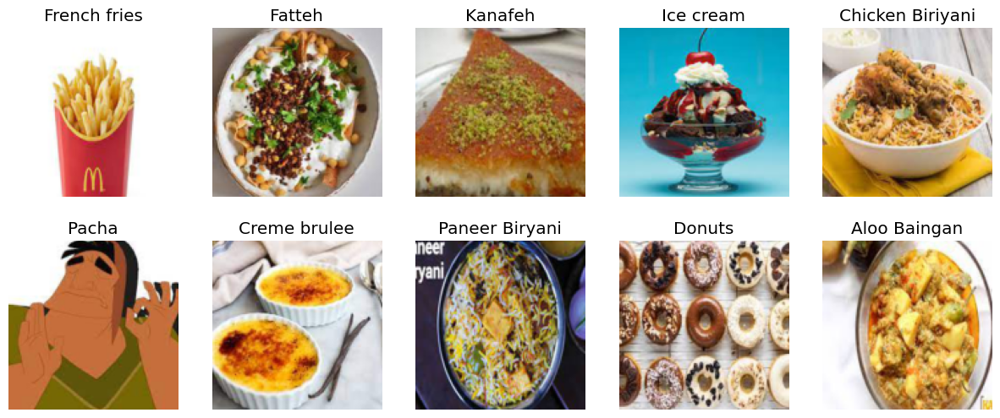

In [ ]:
dblock = dblock.new(item_tfms=RandomResizedCrop(128, min_scale=0.3)) # Randomly cropping, cutting, resizing, coloring parts of image into (128 x 128) size
dls = dblock.dataloaders(data_path)
dls.valid.show_batch(max_n=10, nrows=2)

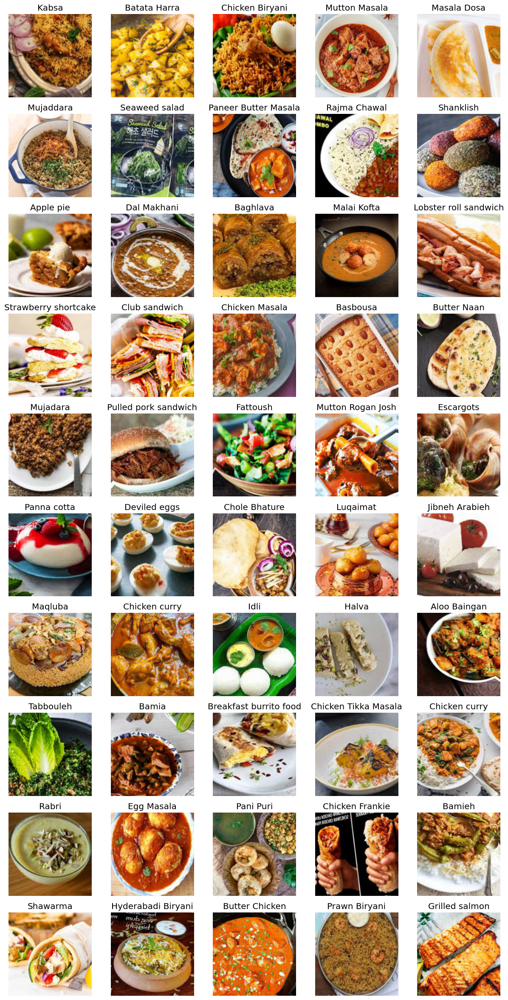

In [ ]:
# RandomResizedCrop crops images randomly and create copies so that we don't miss out anything
# aug_transforms is used for image data augmentation
dblock = dblock.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())
dls = dblock.dataloaders(data_path)
dls.train.show_batch(max_n=50, nrows=10)

In [ ]:
torch.save(dls, "food_items_dataset_v_0.pkl")

In [ ]:
version = 2

In [ ]:
'''
dblock = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter=RandomSplitter(valid_pct = 0.1, seed = 42),
    get_y = parent_label,
    item_tfms=Resize(128)
)'''

'\ndblock = DataBlock(\n    blocks = (ImageBlock, CategoryBlock),\n    get_items = get_image_files,\n    splitter=RandomSplitter(valid_pct = 0.1, seed = 42),\n    get_y = parent_label,\n    item_tfms=Resize(128)\n)'

In [ ]:
'''
dblock = dblock.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())
dls = dblock.dataloaders(data_path, bs=bs)
torch.load(f"food_items_dataset_v_{version}.pkl")
'''

'\ndblock = dblock.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())\ndls = dblock.dataloaders(data_path, bs=bs)\ntorch.load(f"food_items_dataset_v_{version}.pkl")\n'

In [ ]:
model = vision_learner(dls, resnet34, metrics=[error_rate, accuracy])

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 192MB/s]


In [ ]:
model.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,6.558163,4.499993,0.857639,0.142361,12:42


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,4.569036,3.673269,0.755208,0.244792,00:42
1,3.625551,2.827651,0.657986,0.342014,00:42
2,2.736522,2.398508,0.571181,0.428819,00:40
3,2.064533,2.308854,0.539931,0.460069,00:39
4,1.763488,2.263377,0.531250,0.468750,00:41


In [ ]:
model.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.712176,2.287450,0.522569,0.477431,00:38


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.615535,2.300448,0.529514,0.470486,00:40
1,1.523275,2.073273,0.500000,0.500000,00:43
2,1.169749,2.019255,0.479167,0.520833,00:41


In [ ]:
model.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.131467,2.094403,0.515625,0.484375,00:39


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.106638,2.130855,0.505208,0.494792,00:40
1,1.073551,1.990562,0.479167,0.520833,00:41
2,0.812981,1.936232,0.470486,0.529514,00:40


In [ ]:
model.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.786029,2.048810,0.472222,0.527778,00:44


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.718062,2.043849,0.486111,0.513889,00:40
1,0.830384,2.063830,0.473958,0.526042,00:42
2,0.695815,1.971160,0.486111,0.513889,00:40
3,0.516550,1.934493,0.465278,0.534722,00:42


In [ ]:
model.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.509617,2.021100,0.473958,0.526042,00:37


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.558715,2.114130,0.480903,0.519097,00:42
1,0.629130,2.074052,0.480903,0.519097,00:42
2,0.465326,2.039829,0.477431,0.522569,00:39


In [ ]:
model.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.435840,2.170274,0.493056,0.506944,00:39


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.462305,2.279109,0.513889,0.486111,00:40
1,0.516612,2.114274,0.470486,0.529514,00:43
2,0.389825,2.033706,0.468750,0.531250,00:42


In [ ]:
model.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.389305,2.098133,0.475694,0.524306,00:37


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.374727,2.090860,0.475694,0.524306,00:41
1,0.485038,2.231872,0.491319,0.508681,00:39
2,0.476189,2.115407,0.475694,0.524306,00:41
3,0.339582,2.057383,0.458333,0.541667,00:42
4,0.258113,2.036589,0.454861,0.545139,00:41


In [ ]:
model.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.301419,2.178250,0.473958,0.526042,00:38


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.315560,2.165822,0.484375,0.515625,00:39
1,0.400748,2.273942,0.480903,0.519097,00:41
2,0.297143,2.130965,0.460069,0.539931,00:39


In [ ]:
model.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.276682,2.242116,0.461806,0.538194,00:42


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.234668,2.145206,0.451389,0.548611,00:39
1,0.264069,2.251811,0.463542,0.536458,00:41
2,0.329997,2.392627,0.491319,0.508681,00:39
3,0.413314,2.426178,0.479167,0.520833,00:39
4,0.357916,2.228516,0.456597,0.543403,00:42
5,0.301682,2.185394,0.442708,0.557292,00:40
6,0.251069,2.225034,0.473958,0.526042,00:40
7,0.199836,2.209063,0.442708,0.557292,00:39
8,0.169016,2.190866,0.447917,0.552083,00:41
9,0.145466,2.198154,0.440972,0.559028,00:39


In [ ]:
model.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.185005,2.241421,0.449653,0.550347,00:39


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.169017,2.220477,0.463542,0.536458,00:41
1,0.196869,2.333458,0.475694,0.524306,00:40
2,0.287326,2.495142,0.496528,0.503472,00:40
3,0.353044,2.467437,0.491319,0.508681,00:42
4,0.332724,2.337680,0.468750,0.531250,00:39
5,0.278949,2.344317,0.454861,0.545139,00:39
6,0.222907,2.258921,0.446181,0.553819,00:40
7,0.176355,2.217449,0.442708,0.557292,00:38
8,0.157000,2.200636,0.435764,0.564236,00:42
9,0.138143,2.184961,0.442708,0.557292,00:41


In [ ]:
model.save(f"food_items_v_{version}")

Path('models/food_items_v_2.pth')

In [ ]:
interp = ClassificationInterpretation.from_learner(model)
cm = interp.confusion_matrix()

plt.figure(figsize=(100, 100))
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion matrix")
plt.show()

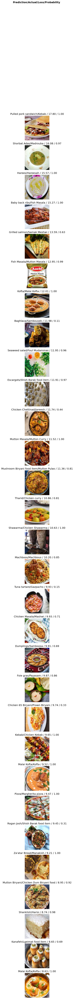

In [ ]:
interp.plot_top_losses(30, nrows=30)

In [ ]:
from fastai.vision.widgets import *

In [ ]:
cleaner = ImageClassifierCleaner(model)
cleaner

In [ ]:
for idx in cleaner.delete():cleaner.fns[idx].unlink()
for idx, food_items in cleaner.change(): shutil.move(str(cleaner.fns[idx]), f"{data_path}/{food_items}")

In [ ]:
model.export(f"{data_path}/food_items_v_{version}.pkl")

In [ ]:
img_path = 'samples'

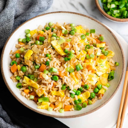

In [ ]:
img = Image.open('/content/drive/MyDrive/samples/test_1.jpg')
img.to_thumb(128,128)

In [ ]:
model.predict('/content/drive/MyDrive/samples/test_1.jpg')

('Fried rice',
 tensor(104),
 tensor([2.1636e-11, 6.6649e-08, 1.3848e-07, 2.4432e-10, 5.4635e-10, 2.7114e-10, 1.2710e-08, 7.3127e-11, 3.2130e-10, 1.0724e-09, 6.7983e-11, 2.2243e-09, 1.5279e-07, 4.6058e-12, 2.5830e-10, 5.2844e-11,
         5.2872e-09, 5.0271e-10, 1.2559e-11, 6.1871e-09, 9.2359e-10, 1.0725e-12, 4.8693e-09, 9.0333e-11, 1.3924e-11, 2.3385e-09, 2.2590e-10, 1.3605e-09, 4.7170e-11, 2.0967e-05, 3.1764e-09, 1.3222e-12,
         6.8398e-13, 8.8676e-06, 2.3465e-07, 3.5246e-11, 3.7296e-12, 5.1374e-13, 3.4059e-10, 9.1773e-12, 8.2631e-11, 5.8606e-11, 1.7540e-11, 4.1484e-11, 6.3569e-12, 6.3757e-12, 3.0555e-02, 1.2944e-11,
         1.0017e-09, 5.8566e-11, 1.0739e-08, 2.3586e-10, 3.3152e-09, 1.5780e-12, 5.6267e-12, 2.9444e-10, 1.0791e-09, 6.7280e-11, 3.9584e-11, 3.9757e-12, 2.3537e-10, 3.0419e-10, 1.0582e-12, 1.4243e-08,
         3.6060e-10, 1.0735e-10, 6.3810e-08, 3.8576e-09, 6.3861e-10, 9.6848e-12, 2.5777e-11, 6.3581e-11, 2.3353e-09, 3.0028e-09, 2.2148e-09, 1.9816e-09, 1.3905e-09, 1.

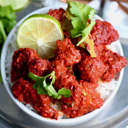

In [ ]:
img = Image.open('/content/drive/MyDrive/samples/chicken-65-2-FP.jpg')
img.to_thumb(128,128)

In [ ]:
model.predict('/content/drive/MyDrive/samples/chicken-65-2-FP.jpg')

('Gobi Manchurian',
 tensor(112),
 tensor([1.2864e-05, 7.0809e-05, 9.7788e-06, 2.0942e-05, 3.0996e-04, 3.1594e-05, 1.9471e-06, 6.9570e-06, 1.8762e-05, 1.5115e-05, 1.2182e-05, 6.9846e-05, 2.3831e-04, 4.3215e-06, 4.4232e-03, 2.5687e-04,
         8.1454e-06, 1.4402e-05, 3.1754e-02, 8.5906e-04, 1.1278e-05, 1.4821e-04, 2.7077e-04, 1.9252e-04, 3.9139e-06, 2.7262e-05, 4.3363e-05, 6.3843e-04, 5.5881e-06, 6.0978e-04, 3.1162e-06, 1.3665e-03,
         3.2700e-05, 9.2083e-05, 1.4814e-04, 5.4314e-06, 2.7734e-05, 5.2755e-03, 6.8445e-03, 6.7943e-03, 1.6812e-04, 7.8063e-05, 1.1935e-05, 2.7815e-03, 1.3235e-04, 3.9745e-05, 7.1015e-06, 1.0665e-04,
         2.9017e-07, 4.2575e-07, 3.9654e-03, 5.7411e-03, 2.1264e-03, 1.2047e-03, 6.6616e-05, 1.2395e-02, 2.8523e-06, 1.4497e-03, 3.4523e-03, 3.2624e-04, 1.0063e-04, 5.0808e-05, 7.4670e-05, 9.0417e-06,
         1.0275e-04, 1.7045e-04, 5.0382e-05, 1.4179e-05, 1.1745e-04, 1.5775e-03, 2.3241e-05, 8.0060e-07, 3.8681e-05, 7.0412e-05, 5.4214e-05, 9.4353e-05, 1.1341e-0